In [2]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.io as po

import folium
from folium import plugins
from folium import Marker
from folium.plugins import Draw

# 한글 폰트 설정
import platform
plt.rc('font', family='Malgun Gothic')
# 마이너스 폰트 설정
plt.rc('axes', unicode_minus=False) 
# 글씨 선명하게 출력하는 설정
%config InlineBackend.figure_format = 'retina'

""" # Warning 제거
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning) 
warnings.simplefilter(action='ignore', category=UserWarning)  
pd.set_option('mode.chained_assignment',  None)   
#pd.set_option('mode.chained_assignment', 'warn') """

" # Warning 제거\nimport warnings\nwarnings.simplefilter(action='ignore', category=FutureWarning) \nwarnings.simplefilter(action='ignore', category=UserWarning)  \npd.set_option('mode.chained_assignment',  None)   \n#pd.set_option('mode.chained_assignment', 'warn') "

In [3]:
train = pd.read_csv(r'data\train.csv')
test = pd.read_csv(r'data\test.csv')
target = pd.read_csv(r'data\sample_submission.csv')

In [4]:
train

,ID,propertyType,bedrooms,latitude,longitude,suburbName,distanceMetro(km),distanceAirport(km),distanceHospital(km),distanceRailway(km),area(square_meters),monthlyRent(us_dollar)
0,Train_0000,Apartment,3,28.638710,77.295822,Delhi East,0.312579,22.646032,11.726966,7.352495,83.61,307
1,Train_0001,Independent Floor,1,28.498940,77.207191,Delhi South,2.486167,13.500583,7.527761,15.877066,83.61,110
2,Train_0002,Independent Floor,3,28.714123,77.154404,Delhi North,1.528794,18.918243,17.135939,10.315737,78.97,369
3,Train_0003,Independent Floor,3,28.704330,77.149956,Other,0.967121,17.749252,16.251937,9.797817,162.58,676
4,Train_0004,Apartment,4,28.577915,77.049446,Dwarka,0.834506,4.288189,15.541840,18.179806,218.32,418
...,...,...,...,...,...,...,...,...,...,...,...,...
8687,Train_8687,Apartment,1,28.602234,77.026001,Dwarka,0.005681,7.776390,18.212199,19.535831,46.45,159
8688,Train_8688,Apartment,1,28.644989,77.169296,Delhi Central,0.007987,12.969368,9.442664,5.039023,81.29,172
8689,Train_8689,Independent Floor,3,28.547377,77.259155,Delhi South,0.203502,17.094466,5.468956,11.109941,148.64,738
8690,Train_8690,Independent Floor,1,28.630501,77.277382,Delhi East,0.248603,20.628700,9.801128,5.679541,41.90,184


In [5]:
train.propertyType.unique()

array(['Apartment', 'Independent Floor', 'Independent House', 'Villa'],
      dtype=object)

In [6]:
train.suburbName.unique()

array(['Delhi East', 'Delhi South', 'Delhi North', 'Other', 'Dwarka',
       'West Delhi', 'Delhi Central', 'North Delhi', 'South West Delhi',
       'Delhi West', 'Rohini', 'North West Delhi'], dtype=object)

In [7]:
train.describe()

,bedrooms,latitude,longitude,distanceMetro(km),distanceAirport(km),distanceHospital(km),distanceRailway(km),area(square_meters),monthlyRent(us_dollar)
count,8692.000000,8692.000000,8692.000000,8692.000000,8692.000000,8692.000000,8692.000000,8692.000000,8692.000000
mean,2.119650,28.611199,77.167464,0.869998,13.699359,11.373803,11.419991,101.990737,321.376898
std,0.900757,0.070853,0.093600,1.261337,7.926709,7.500915,7.345131,59.355027,230.962181
min,1.000000,26.467743,76.742523,0.002892,1.901789,0.669150,0.722023,9.290000,14.000000
25%,1.000000,28.563490,77.102028,0.459687,11.152285,8.167231,8.075549,55.740000,159.000000
50%,2.000000,28.616885,77.168053,0.698592,13.139656,10.922441,11.244344,83.610000,258.000000
75%,3.000000,28.651827,77.224998,1.092694,17.225196,15.548549,15.435535,139.350000,393.000000
max,8.000000,28.872597,80.339027,65.866623,396.043067,387.016246,390.969378,882.580000,1476.000000


<AxesSubplot:xlabel='monthlyRent(us_dollar)', ylabel='Count'>

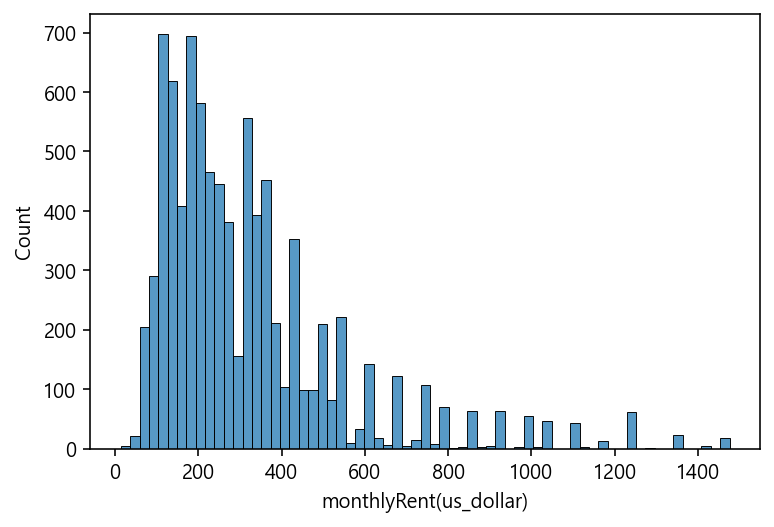

In [8]:
sns.histplot(data=train,x='monthlyRent(us_dollar)')

In [9]:
""" df_map = folium.Map(location=[28.616885, 77.168053], zoom_start=11)
def color_select(row):  
    dollar = row['monthlyRent(us_dollar)'] 
    if dollar <= 200 : return 'red'
    elif 200 < dollar <= 400 : return 'orange'
    elif 400 < dollar <= 600 : return 'yellow'
    elif 600 < dollar <= 800 : return 'green'
    elif 800 < dollar <= 1000 : return 'blue'
    else : return 'pulple'  

for _,row in train.iterrows():
    folium.Circle([row['latitude'], row['longitude']],
                 popup=row['monthlyRent(us_dollar)'],
                 radius = 50,
                 fill=True,
                 color = color_select(row)).add_to(df_map)

plugins.ScrollZoomToggler().add_to(df_map)
draw = Draw()
draw.add_to(df_map)
df_map """

In [10]:
train

,ID,propertyType,bedrooms,latitude,longitude,suburbName,distanceMetro(km),distanceAirport(km),distanceHospital(km),distanceRailway(km),area(square_meters),monthlyRent(us_dollar)
0,Train_0000,Apartment,3,28.638710,77.295822,Delhi East,0.312579,22.646032,11.726966,7.352495,83.61,307
1,Train_0001,Independent Floor,1,28.498940,77.207191,Delhi South,2.486167,13.500583,7.527761,15.877066,83.61,110
2,Train_0002,Independent Floor,3,28.714123,77.154404,Delhi North,1.528794,18.918243,17.135939,10.315737,78.97,369
3,Train_0003,Independent Floor,3,28.704330,77.149956,Other,0.967121,17.749252,16.251937,9.797817,162.58,676
4,Train_0004,Apartment,4,28.577915,77.049446,Dwarka,0.834506,4.288189,15.541840,18.179806,218.32,418
...,...,...,...,...,...,...,...,...,...,...,...,...
8687,Train_8687,Apartment,1,28.602234,77.026001,Dwarka,0.005681,7.776390,18.212199,19.535831,46.45,159
8688,Train_8688,Apartment,1,28.644989,77.169296,Delhi Central,0.007987,12.969368,9.442664,5.039023,81.29,172
8689,Train_8689,Independent Floor,3,28.547377,77.259155,Delhi South,0.203502,17.094466,5.468956,11.109941,148.64,738
8690,Train_8690,Independent Floor,1,28.630501,77.277382,Delhi East,0.248603,20.628700,9.801128,5.679541,41.90,184


In [ ]:
from sklearn.preprocessing import OneHotEncoder


In [11]:
from sklearn.model_selection import train_test_split
X = train.drop(['ID','monthlyRent(us_dollar)'], axis=1)
y = train['monthlyRent(us_dollar)']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)

train_X = train.drop(['ID','착과량(int)','9월새순평균'	,'10월새순평균',	'11월새순평균',	'델타9월새순'], axis=1)
train_y = train['착과량(int)']
test_X = test.drop(['ID','9월새순평균'	,'10월새순평균',	'11월새순평균'], axis=1)

KeyError: "['착과량(int)', '9월새순평균', '10월새순평균', '11월새순평균', '델타9월새순'] not found in axis"